<a href="https://colab.research.google.com/github/breeramon/Comparacao-de-Imagens-Simples/blob/main/CompImagensGrupo6.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

CÉDULA 1 - IMPORTS

In [18]:
# --- Imports Necessários---
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow
from google.colab import files
from skimage.transform import rotate

# Para SSIM
from skimage.metrics import structural_similarity

# Para Tarefas 4 e 5 (Gerar .csv e ranking)
import pandas as pd

CÉDULA 2

In [19]:
def ler_imagem(caminho_arquivo):
    """Lê uma imagem usando cv.imread()"""
    return cv.imread(caminho_arquivo)

def exibir_imagem_colab(imagem, titulo="Imagem"):
    """Exibe a imagem no Google Colab usando cv2_imshow()"""
    print(titulo)
    cv2_imshow(imagem)

def converter_para_cinza(imagem):
    """Converte a imagem para escala de cinza usando cv.cvtColor()"""
    # Verifica se a imagem já não é cinza
    if len(imagem.shape) == 3 and imagem.shape[2] == 3:
        return cv.cvtColor(imagem, cv.COLOR_BGR2GRAY)
    return imagem

def rotacionar_imagem(imagem, angulo):
    """Rotaciona a imagem usando a função rotate() do skimage"""
    # Opcional: resize=True para evitar cortes
    return rotate(imagem, angulo, resize=True, mode='constant', cval=0, preserve_range=True).astype(imagem.dtype)

def diferenciar_imagens_xor(img1, img2):
    """
    Gera um mapa de diferença visual usando cv.bitwise_xor().
    Isso atende ao Requisito RF06.
    """
    # Garante que as imagens tenham o mesmo tamanho (requisito para bitwise_xor)
    if img1.shape != img2.shape:
        # Redimensiona img2 para o tamanho da img1
        print("Aviso: Imagens com tamanhos diferentes. Redimensionando para comparação.")
        img2 = cv.resize(img2, (img1.shape[1], img1.shape[0]))

    return cv.bitwise_xor(img1, img2)

*TESTE CÉDULA 2*

Testando ler_imagem...
SUCESSO: Imagem lida. Dimensões: (742, 740, 3)

Testando exibir_imagem_colab...
Teste de Exibição


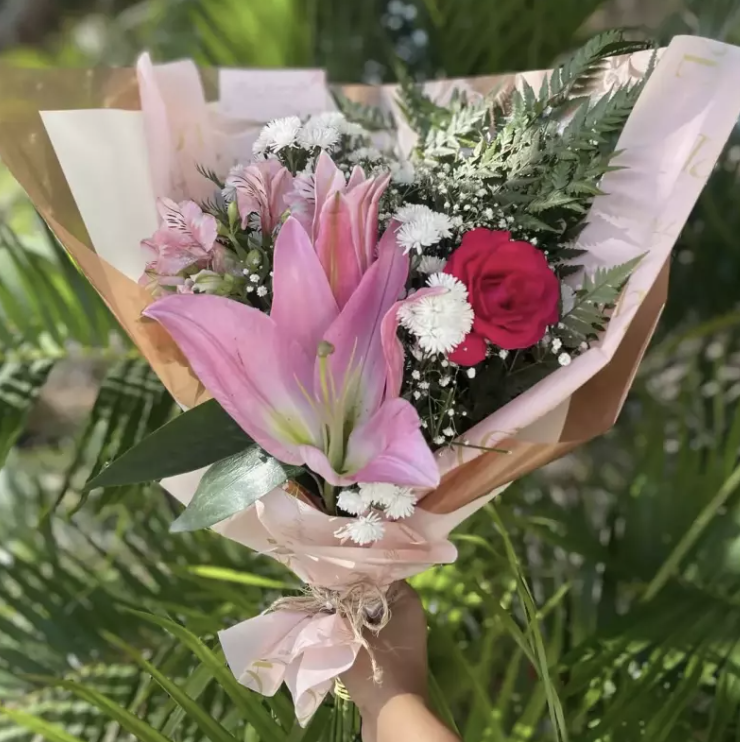


Testando converter_para_cinza...
Teste de Cinza


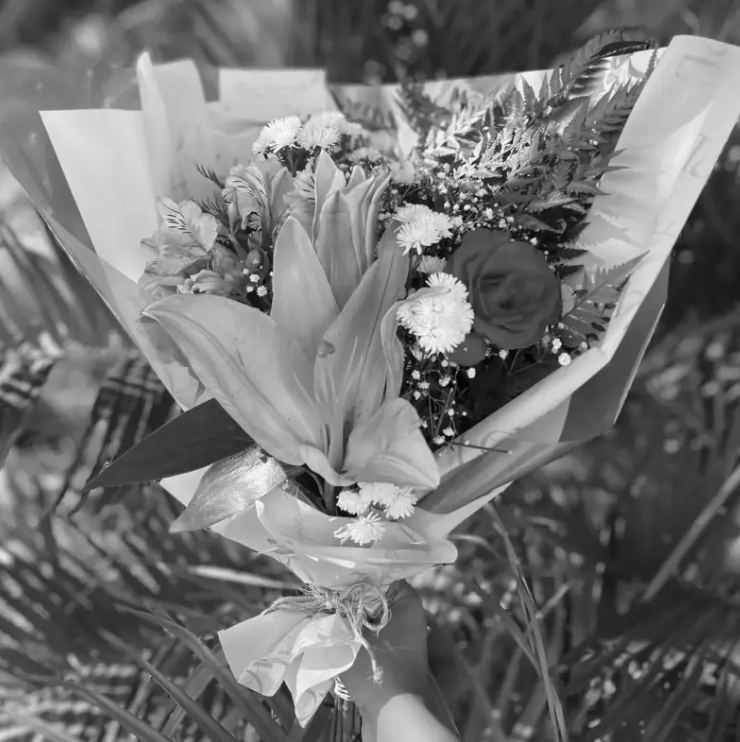


Testando rotacionar_imagem...
Teste de Rotação


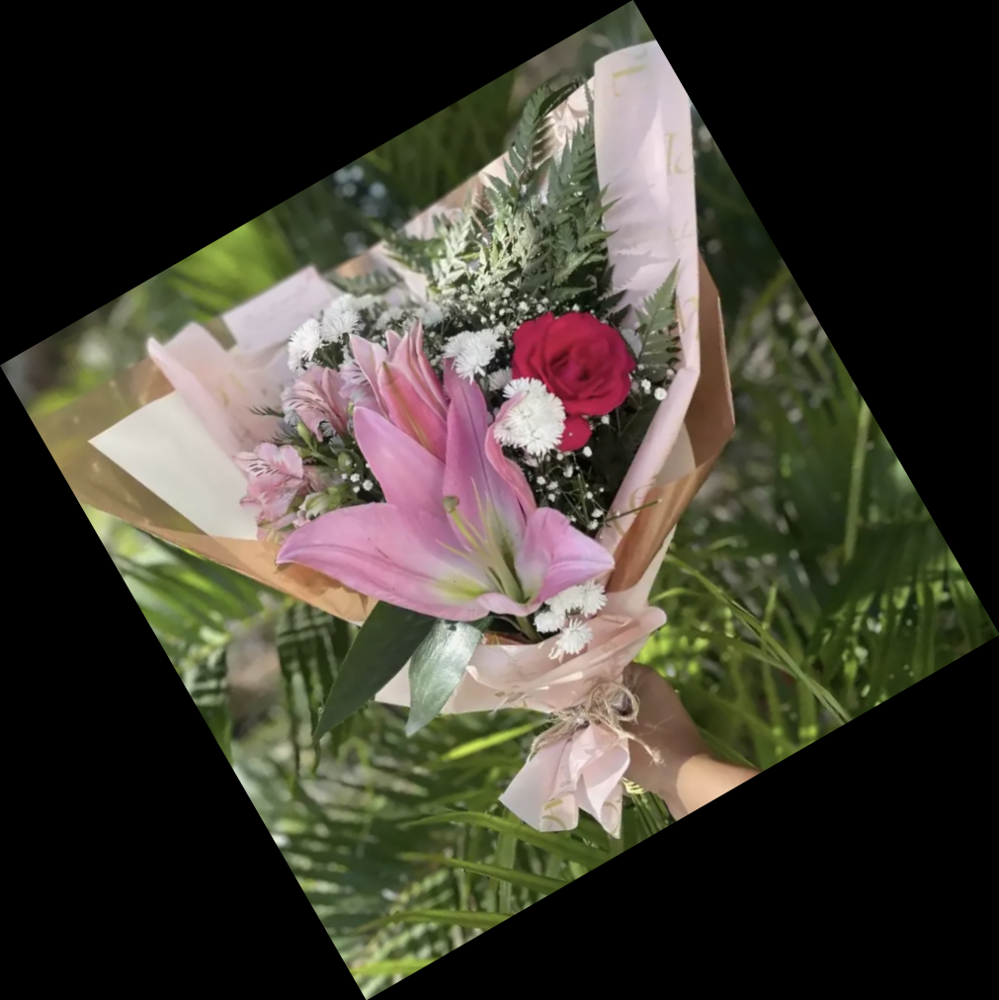


Testando diferenciar_imagens_xor (comparando com ela mesma)...
Teste XOR (Zero)


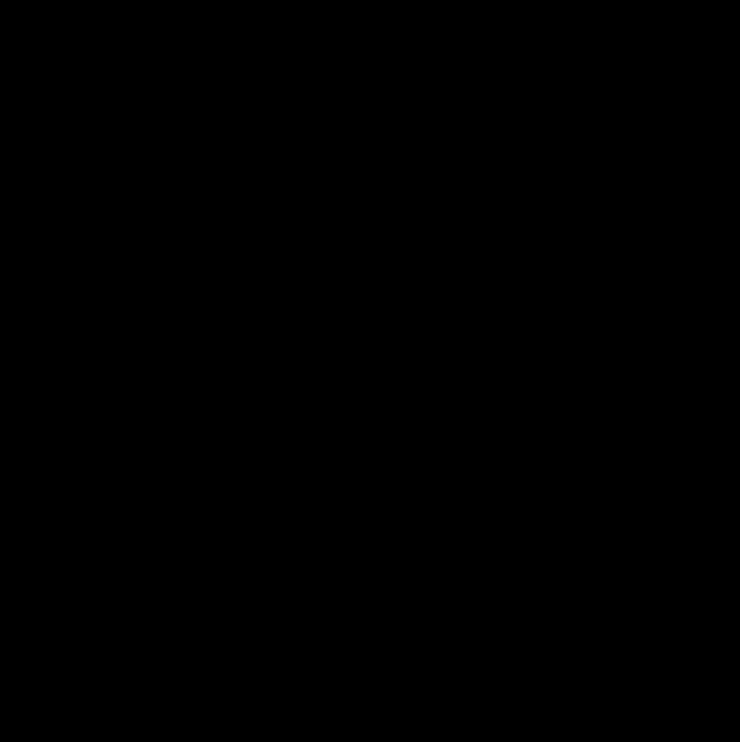


Testando diferenciar_imagens_xor (comparando com rotacionada)...
Aviso: Imagens com tamanhos diferentes. Redimensionando para comparação.
Teste XOR (Diferente)


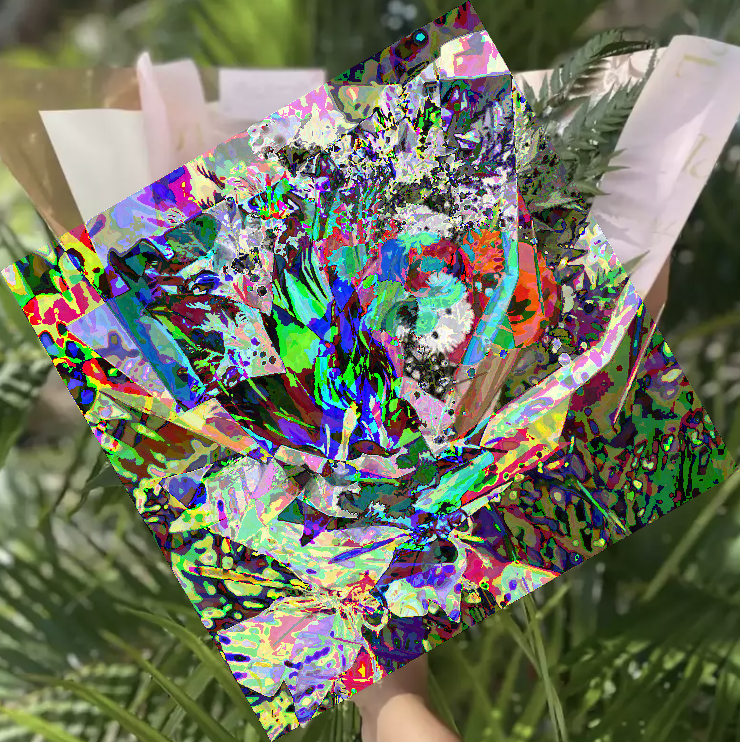

In [20]:
# --- Início do Teste da Célula 2 ---
print("Testando ler_imagem...")
img_teste = ler_imagem('flores.png') # Use o nome da imagem que você subiu

# Teste de falha:
if img_teste is None:
    print("FALHA: Não foi possível ler a imagem. Verifique o nome do arquivo.")
else:
    print("SUCESSO: Imagem lida. Dimensões:", img_teste.shape)

    print("\nTestando exibir_imagem_colab...")
    exibir_imagem_colab(img_teste, "Teste de Exibição")
    # Resultado esperado: A imagem deve aparecer no output.

    print("\nTestando converter_para_cinza...")
    img_cinza = converter_para_cinza(img_teste)
    exibir_imagem_colab(img_cinza, "Teste de Cinza")
    # Resultado esperado: A imagem deve aparecer em escala de cinza.

    print("\nTestando rotacionar_imagem...")
    img_rotacionada = rotacionar_imagem(img_teste, 30) # Rotaciona 30 graus
    exibir_imagem_colab(img_rotacionada, "Teste de Rotação")
    # Resultado esperado: A imagem deve aparecer rotacionada.

    print("\nTestando diferenciar_imagens_xor (comparando com ela mesma)...")
    mapa_dif_zero = diferenciar_imagens_xor(img_teste, img_teste)
    exibir_imagem_colab(mapa_dif_zero, "Teste XOR (Zero)")
    # Resultado esperado: A imagem deve ser COMPLETAMENTE PRETA (pois é idêntica).

    print("\nTestando diferenciar_imagens_xor (comparando com rotacionada)...")
    mapa_dif_rot = diferenciar_imagens_xor(img_teste, img_rotacionada)
    exibir_imagem_colab(mapa_dif_rot, "Teste XOR (Diferente)")
    # Resultado esperado: Uma imagem com contornos/áreas claras onde há diferença.
# --- Fim do Teste da Célula 2 ---

CÉDULA 3

In [21]:
def calcular_diferenca_media(img1, img2):
    """
    Calcula a "diferença média" (Tarefa 2).
    Implementa a "Diferença Absoluta" de forma métrica.
    """
    # Garante que as imagens tenham o mesmo tamanho
    if img1.shape != img2.shape:
        img2 = cv.resize(img2, (img1.shape[1], img1.shape[0]))

    # Calcula a diferença absoluta e depois a média
    diferenca = cv.absdiff(img1.astype("float"), img2.astype("float"))
    media_diferenca = np.mean(diferenca)
    return media_diferenca

def calcular_ssim(img1, img2):
    """Calcula o SSIM (Structural Similarity Index)"""

    # Converte para escala de cinza, pois o SSIM é geralmente calculado em monocromático
    img1_cinza = converter_para_cinza(img1)
    img2_cinza = converter_para_cinza(img2)

    # Garante que as imagens tenham o mesmo tamanho
    if img1_cinza.shape != img2_cinza.shape:
        img2_cinza = cv.resize(img2_cinza, (img1_cinza.shape[1], img1_cinza.shape[0]))

    # O 'data_range' é o intervalo dinâmico da imagem (255 para 8-bit)
    (score, diff_map) = structural_similarity(img1_cinza, img2_cinza, full=True, data_range=255)

    # O diff_map também pode ser usado como mapa visual
    return score

def calcular_indice_ruido_residual(img_processada):
    """(Pendente) Calcula o índice de ruído residual (Tarefa 3)"""
    # Esta métrica NÃO está definida no PDF da Unidade I.
    # Precisaremos da fórmula/definição dela.
    print("Implementação do 'índice de ruído residual' pendente.")
    return 0.0

*TESTE CÉDULA 3*

In [22]:
# --- Início do Teste da Célula 3 ---
print("\nTestando calcular_diferenca_media (consigo mesma)...")
media_zero = calcular_diferenca_media(img_teste, img_teste)
print(f"Resultado: {media_zero}")
# Resultado esperado: Deve imprimir 0.0

print("\nTestando calcular_diferenca_media (com rotacionada)...")
media_dif = calcular_diferenca_media(img_teste, img_rotacionada)
print(f"Resultado: {media_dif}")
# Resultado esperado: Deve imprimir um número positivo (ex: 45.123...)

print("\nTestando calcular_ssim (consigo mesma)...")
ssim_um = calcular_ssim(img_teste, img_teste)
print(f"Resultado: {ssim_um}")
# Resultado esperado: Deve imprimir 1.0

print("\nTestando calcular_ssim (com rotacionada)...")
ssim_dif = calcular_ssim(img_teste, img_rotacionada)
print(f"Resultado: {ssim_dif}")
# Resultado esperado: Deve imprimir um número menor que 1 (ex: 0.345...)
# --- Fim do Teste da Célula 3 ---


Testando calcular_diferenca_media (consigo mesma)...
Resultado: 0.0

Testando calcular_diferenca_media (com rotacionada)...
Resultado: 79.58825611325611

Testando calcular_ssim (consigo mesma)...
Resultado: 1.0

Testando calcular_ssim (com rotacionada)...
Resultado: 0.11080557439857988


CÉDULA 4

Imagens carregadas (exemplo).

--- Iniciando Processamento ---

--- Processando: Processamento 1 ---
Implementação do 'índice de ruído residual' pendente.
Resultados Métricos para Processamento 1:
  Diferença Média: 35.5090
  SSIM (Similaridade): 0.8601
Mapa de Diferença (XOR) - Processamento 1


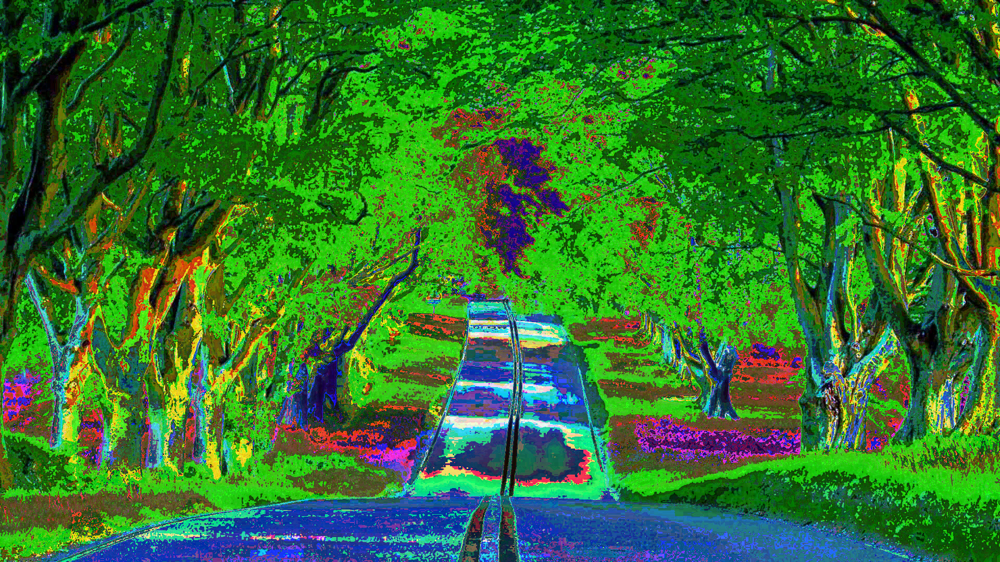


--- Processando: Processamento 2 ---
Implementação do 'índice de ruído residual' pendente.
Resultados Métricos para Processamento 2:
  Diferença Média: 66.8724
  SSIM (Similaridade): 0.6636
Mapa de Diferença (XOR) - Processamento 2


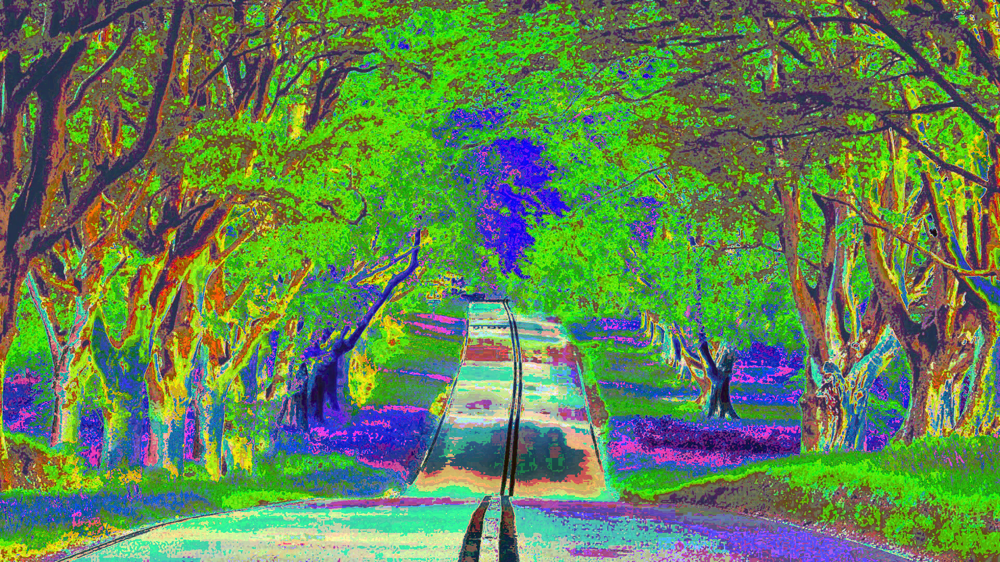


--- Processamento Concluído ---


In [23]:
# --- 1. Carregar Imagens ---
# (Substitua pelos nomes das suas imagens)
try:
    # Tenta carregar imagens de exemplo
    img_original = ler_imagem('avenida.jpg')
    img_processada_1 = ler_imagem('avenidaEDIT.jpg')
    img_processada_2 = ler_imagem('avenidaEDIT2.jpg')

    if img_original is None:
        raise FileNotFoundError("Imagem original não encontrada.")

    print("Imagens carregadas (exemplo).")

    # Lista de imagens para processar
    imagens_para_comparar = [
        {"nome": "Processamento 1", "img": img_processada_1},
        {"nome": "Processamento 2", "img": img_processada_2}
    ]

except FileNotFoundError:
    print("Arquivos de exemplo não encontrados.")
    print("Por favor, faça o upload das suas imagens (original e processadas).")
    # files.upload() # Descomente para fazer upload

# Lista para guardar os resultados (para Tarefa 4)
lista_de_resultados = []

print("\n--- Iniciando Processamento ---")

# --- 2. Alinhar Imagens ---
# (Esta etapa é complexa, vamos assumir que estão alinhadas por enquanto)
# (Se não estiverem, teríamos que usar técnicas como feature matching)

for item in imagens_para_comparar:
    nome = item["nome"]
    img_proc = item["img"]

    if img_proc is None:
        print(f"Erro ao carregar {nome}. Pulando.")
        continue

    print(f"\n--- Processando: {nome} ---")

    # --- 3. Aplicar Métricas de Comparação ---

    # Métrica 1: Diferença Média (Tarefa 2)
    diff_media = calcular_diferenca_media(img_original, img_proc)

    # Métrica 2: SSIM (Tarefa 2)
    ssim_score = calcular_ssim(img_original, img_proc)

    # Métrica 3: Ruído Residual (Tarefa 3)
    ruido_residual = calcular_indice_ruido_residual(img_proc) # Pendente

    # --- 4. Gerar Mapa de Diferenças ---
    mapa_diferenca = diferenciar_imagens_xor(img_original, img_proc)

    # --- 5. Exibir Resultado Visual e Métrico [cite: 93] ---
    print(f"Resultados Métricos para {nome}:")
    print(f"  Diferença Média: {diff_media:.4f}")
    print(f"  SSIM (Similaridade): {ssim_score:.4f}")

    exibir_imagem_colab(mapa_diferenca, f"Mapa de Diferença (XOR) - {nome}")

    # Adiciona à lista para o CSV (Tarefa 4)
    lista_de_resultados.append({
        "Imagem_Processada": nome,
        "Diferenca_Media": diff_media,
        "SSIM": ssim_score,
        "Ruido_Residual_Pendente": ruido_residual
    })

print("\n--- Processamento Concluído ---")

In [24]:
if lista_de_resultados:
    # --- 4. Registrar todos os resultados em .csv ---
    df_resultados = pd.DataFrame(lista_de_resultados)

    # --- 5. Criar um ranking automático ---
    # Vamos rankear pelo SSIM (quanto maior, melhor)
    df_ranking = df_resultados.sort_values(by="SSIM", ascending=False)
    df_ranking['Ranking_Qualidade'] = range(1, len(df_ranking) + 1)

    print("\n--- Ranking Final de Qualidade (Baseado no SSIM) ---")
    print(df_ranking.to_string()) # .to_string() formata melhor no Colab

    # Salvar em CSV
    nome_arquivo_csv = 'ranking_comparacao_grupo6.csv'
    df_ranking.to_csv(nome_arquivo_csv, index=False)

    print(f"\nResultados salvos em '{nome_arquivo_csv}'.")
    # files.download(nome_arquivo_csv) # Descomente para baixar o CSV

else:
    print("Nenhum resultado foi processado para gerar o ranking.")


--- Ranking Final de Qualidade (Baseado no SSIM) ---
  Imagem_Processada  Diferenca_Media      SSIM  Ruido_Residual_Pendente  Ranking_Qualidade
0   Processamento 1        35.508990  0.860115                      0.0                  1
1   Processamento 2        66.872446  0.663595                      0.0                  2

Resultados salvos em 'ranking_comparacao_grupo6.csv'.
